### ESRGAN - Enhanced Super-Resolution Generative Adversarial Network

<small>

U ovom delu implementiran je **ESRGAN** (*Enhanced Super-Resolution Generative Adversarial Network*) kao **treći i najnapredniji model** za **super-rezoluciju slika**.

- ESRGAN predstavlja dalje **unapređenje SRResNet arhitekture**, pri čemu se standardni rezidualni blokovi zamenjuju **RRDB blokovima** (*Residual-in-Residual Dense Blocks*).
- Za razliku od prethodnog **SRResNet modela**, cilj ESRGAN-a nije samo smanjenje **pixel-wise greške**, već i generisanje **vizuelno realističnijih i detaljnijih rekonstrukcija**.
- Tokom treniranja koriste se **pixel loss**, **perceptual loss** i **adversarial loss**, čime se model podstiče da pored globalne strukture slike bolje rekonstruiše **teksture, ivice i sitne detalje**.
- Kao i kod SRResNet-a, **LR slike** dimenzija $32\times32$ direktno se prosleđuju modelu, dok generator vrši povećavanje rezolucije za faktor $\times4$ i generiše slike dimenzija $128\times128$.
- **Performanse modela** procenjene su pomoću **PSNR** i **SSIM metrika**, uz poređenje rezultata **ESRGAN**-a sa **BICUBIC interpolacijom**.

</small>

#### 0 : Podešavanje Google Colab okruženja


<small>

Fajlovi (`.npy` podaci i eventualno pretrained checkpoint-i) su direktno uploadovani u Colab okruženje (`/content/...`), pa nije potreban Google Drive. Napomena: **`/content` je efemeran** — sve što je tu se briše kad se runtime restartuje ili istekne, pa checkpoint-e (`esrgan_generator_pretrained.pth`, `esrgan_best.pth`) treba **preuzeti na kraju sesije** (desni klik na fajl u Files panelu → Download), da se ne izgube.

</small>


In [1]:
import torch
print("CUDA dostupna:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))


CUDA dostupna: True
GPU: Tesla T4


In [2]:
import os

DATA_DIR = "/content/data"
MODEL_DIR = "/content/models"

os.makedirs(MODEL_DIR, exist_ok=True)


In [13]:
import random
import numpy as np
import torch
from PIL import Image

SEED = 48
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

<small>

> Radi obezbeđivanja **reproduktivnosti rezultata**, postavljen je **fiksni random seed** ($SEED = 48$) za biblioteke $random$ i $NumPy$. <br>
> Na ovaj način se kontrolišu slučajni procesi, poput inicijalizacije težina modela i mešanja podataka tokom treniranja, tako da se pri ponovnom pokretanju koda pod istim uslovima dobijaju isti ili što konzistentniji rezultati.

</small>

#### I : Učitavanje biblioteka i pripremljenih trening i validacionih skupova

<small>

Učitavaju se prethodno pripremljeni **LR** i **HR podaci** iz $02\_Data\_Preparation.ipynb$ fajla. **LR slike** imaju dimenzije $32×32$, dok **HR slike** imaju dimenzije $128×128$ i predstavljaju **ciljne vrednosti** za treniranje modela.

</small>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

X_train = np.load(f"{DATA_DIR}/X_train.npy")
y_train = np.load(f"{DATA_DIR}/y_train.npy")

X_val = np.load(f"{DATA_DIR}/X_val.npy")
y_val = np.load(f"{DATA_DIR}/y_val.npy")

print("X_train:", X_train.shape)
print("y_train:", y_train.shape)

print("X_val:", X_val.shape)
print("y_val:", y_val.shape)


<small>

> **Trening skup** sadrži $8.000$ parova, dok **validacioni skup** sadrži $1.000$ parova.<br>
> **LR** slike imaju dimenzije $32×32×3$, a odgovarajuće **HR** slike $128×128×3$, pri čemu $3$ **kanala** predstavljaju **RGB komponente** slike.

</small>

#### II : Normalizacija vrednosti piksela trening i validacionih podataka

<small>

Radi stabilnijeg i efikasnijeg treniranja neuronske mreže, vrednosti piksela **normalizuju** se sa **originalnog intervala** $[0, 255]$ na **interval** $[0, 1]$.

- Ovim postupkom se **vrednosti piksela** svode na **manji** i **ujednačen numerički opseg**, čime se **olakšava proces učenja** i doprinosi **stabilnijem radu modela**.
- Normalizacija nije izvršena tokom pripreme podataka, jer **SRCNN** zahteva prethodno **povećavanje LR slika BICUBIC interpolacijom** pre **normalizacije**, dok **SRResNet** i **ESRGAN** koriste LR slike u njihovoj **originalnoj rezoluciji**.

</small>

In [5]:
X_train = X_train.astype("float32") / 255.0
y_train = y_train.astype("float32") / 255.0

X_val = X_val.astype("float32") / 255.0
y_val = y_val.astype("float32") / 255.0

print("X_train min:", X_train.min())
print("X_train max:", X_train.max())

print("y_train min:", y_train.min())
print("y_train max:", y_train.max())

X_train min: 0.0
X_train max: 1.0
y_train min: 0.0
y_train max: 1.0


<small>

> Nakon normalizacije, **vrednosti piksela** u **trening skupu** za LR i HR slike nalaze se u očekivanom intervalu $[0, 1]$, što potvrđuje da je **normalizacija** uspešno izvršena.

</small>

#### III : Konverzija podataka u tenzore i priprema za treniranje

<small>

Nakon prethodne obrade, podaci se pripremaju za unos u **ESRGAN model** implementiran u PyTorch-u.

- **Prilagođavanje formata**: LR i HR slike se **transponuju** iz formata $(H, W, C)$ u $(C, H, W)$, jer PyTorch **konvolutivni slojevi** očekuju da se **broj kanala** nalazi **pre dimenzija slike**.
- **Konverzija u tenzore**: $NumPy$ nizovi se pretvaraju u $torch.Tensor$ objekte kako bi mogli direktno da se koriste u PyTorch modelu.
- **Formiranje skupova**: Odvojeno se formiraju $train\_dataset$ i $val\_dataset$, koji sadrže **ulazne BICUBIC slike** i odgovarajuće **originalne HR slike**.
- **Batch obrada**: Podaci se organizuju u **batch**-eve od $16$ slika, čime se omogućava **istovremena obrada** više uzoraka tokom treniranja.
- **Mešanje podataka**: Trening podaci se nasumično mešaju ($shuffle=True$) kako bi se **smanjila zavisnost modela** od **redosleda uzoraka**, dok se kod validacionog skupa redosled zadržava ($shuffle=False$) radi konzistentne evaluacije.

</small>

In [6]:
import torch
from torch.utils.data import TensorDataset, DataLoader

X_train = np.transpose(X_train, (0, 3, 1, 2))
y_train = np.transpose(y_train, (0, 3, 1, 2))

X_val = np.transpose(X_val, (0, 3, 1, 2))
y_val = np.transpose(y_val, (0, 3, 1, 2))

print("X_train:", X_train.shape)
print("y_train:", y_train.shape)

X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32)

X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.float32)

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, y_val_tensor)

g = torch.Generator()
g.manual_seed(SEED)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, generator=g)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)

X_train: (8000, 3, 32, 32)
y_train: (8000, 3, 128, 128)


<small>

> Nakon transponovanja, **trening podaci** imaju oblik $(8000, 3, 32, 32)$, tj. $(8000, 3, 128, 128)$, što odgovara $PyTorch$ formatu (**broj slika**, **broj kanala**, **visina**, **širina**). <br>
> Za razliku od SRCNN modela, nije potrebno prethodno povećavanje LR slika BICUBIC interpolacijom. Kao i kod **SRResNet-a**, povećavanje prostorne rezolucije vrši se **unutar same mreže**.

</small>

#### IV : Arhitektura ESRGAN sistema

<small>

**ESRGAN** (*Enhanced Super-Resolution Generative Adversarial Network*) predstavlja **GAN arhitekturu namenjenu super-rezoluciji slika**, čiji je cilj rekonstrukcija slike **visoke rezolucije (HR)** na osnovu odgovarajuće slike **niske rezolucije (LR)**. Za razliku od klasičnih konvolucionih modela za super-rezoluciju, **ESRGAN** ne pokušava samo da minimizuje razliku između vrednosti piksela rekonstruisane i originalne slike, već je usmeren i na generisanje **vizuelno uverljivih tekstura i sitnih detalja**.

**ESRGAN sistem** se zasniva na **dve neuronske mreže — generatoru** (*Generator*) i **diskriminatoru** (*Discriminator*), koje se tokom treninga optimizuju kroz međusobno suprotstavljene ciljeve.

- **Generator (G)** prima **LR sliku** i na osnovu nje generiše odgovarajuću **SR** (*Super-Resolved*) **sliku** veće rezolucije. Osnovu generatora čine **RRDB** (*Residual-in-Residual Dense Block*) blokovi, koji omogućavaju efikasno **izdvajanje** i **kombinovanje karakteristika slike** na različitim nivoima. Nakon izdvajanja karakteristika, vrši se **uvećanje prostorne rezolucije** (*upsampling*) kako bi se dobila izlazna slika željenih dimenzija.
- **Diskriminator (D)** tokom treninga dobija dve vrste slika: **stvarne HR slike** iz skupa podataka i **SR slike generisane generatorom**. Njegov zadatak je da ***nauči** da **razlikuje stvarne od generisanih slika**. Na taj način diskriminator pruža generatoru povratnu informaciju koja ga usmerava ka stvaranju sve **realističnijih rezultata**.

**Generator** i **diskriminator** zajedno formiraju **adversarijalni sistem**: **generator** nastoji da **proizvede SR slike** koje će biti što **sličnije** stvarnim **HR slikama**, dok **diskriminator** nastoji da ih **pravilno razlikuje**. Njihovim **zajedničkim treningom generator postepeno uči** ne samo **rekonstrukciju osnovne strukture slike**, već i **tekstura, ivica i finih detalja** koji su značajni za perceptivni kvalitet rezultata.

Pored same arhitekture generatora i diskriminatora, važan deo **ESRGAN** sistema predstavlja i način definisanja **funkcije gubitka generatora**, koja kombinuje informacije o **razlici između rekonstruisane i originalne slike**, njihovim **perceptivnim karakteristikama** i **uspešnosti generatora** u odnosu na diskriminator. Na taj način **ESRGAN** pravi **kompromis** između **numeričke tačnosti rekonstrukcije** i **vizuelnog realizma generisane slike**.

**Tok obrade** može se pojednostavljeno **predstaviti** kao:

 1) **LR slika → Generator (RRDB blokovi + upsampling) → SR slika**

dok se **tokom treninga generisana SR slika**, zajedno sa **odgovarajućom stvarnom HR slikom**, **prosleđuje diskriminatoru**:

 2) **SR / HR slika → Diskriminator → procena realnosti slike**

Nakon **završenog treninga**, za samu **rekonstrukciju** novih slika **koristi** se **generator**, dok je **diskriminator** prvenstveno potreban tokom **procesa treniranja**.

</small>

##### 1\) Arhitektura ESRGAN generatora

<small>

**Generator** predstavlja **centralni** deo **ESRGAN sistema** i njegov osnovni zadatak je da iz ulazne slike **niske rezolucije (LR)** generiše odgovarajuću sliku **visoke rezolucije (SR)**. Generator postepeno **izdvaja karakteristike** ulazne slike, **obrađuje ih** kroz **veliki broj povezanih konvolucionih blokova**, a zatim **povećava prostornu rezoluciju slike** do željenih dimenzija.

**Arhitektura generatora** može se podeliti na **tri glavna dela**:

1. **Početni konvolucioni sloj**  

   - Ulazna **LR slika** najpre prolazi kroz **konvolucioni sloj** čiji je zadatak da **iz originalnih RGB vrednosti izdvoji početne karakteristike slike**, kao što su **ivice, prelazi, oblici i teksture**.
   - Dobijene **mape karakteristika** predstavljaju **ulaz** u **glavni deo generatora**.

2. **RRDB blokovi** (*Residual-in-Residual Dense Blocks*)

   - **Glavni deo ESRGAN generatora** čini niz **RRDB blokova**, koji omogućavaju **učenje složenijih karakteristika slike**.
   - Svaki **RRDB blok** sadrži **više međusobno povezanih** **RDB**(*Residual Dense Block*) **blokova**.
   - Unutar ovih blokova koriste se **dense veze**, tako da se **izlazi prethodnih slojeva prosleđuju narednim slojevima**.
   - Na ovaj način **mreža** može **ponovo da koristi** već **izdvojene karakteristike** i **kombinuje informacije sa različitih nivoa**.
   - Pored **dense veza**, koriste se i **rezidualne** (*skip*) **veze**, kojima se **ulaz određenog bloka direktno dodaje njegovom izlazu**.
   - One omogućavaju **efikasniji protok informacija** i **gradijenata** kroz **duboku mrežu** i **olakšavaju njeno treniranje**.
   - Naziv **Residual-in-Residual** potiče upravo od **postojanja rezidualnih veza na više nivoa** — **rezidualne strukture** postoje **unutar pojedinačnih blokova**, ali i **oko grupe tih blokova**.

3. **Upsampling i izlazni slojevi**

   - Nakon prolaska kroz **RRDB blokove**, dobijene **mape karakteristika** prolaze kroz **upsampling slojeve**, čiji je zadatak **povećanje prostornih dimenzija slike**.
   - Kod **super-rezolucije** sa **faktorom ×4**, **rezolucija** se tipično **povećava** u **dva uzastopna koraka** od **×2**.
   - Nakon **povećanja rezolucije**, **završni konvolucioni slojevi** pretvaraju **izdvojene mape karakteristika** u konačnu **RGB sliku sa tri kanala**, koja predstavlja generisanu **SR sliku**.

Pojednostavljeno, **tok podataka** kroz **ESRGAN generator** može se predstaviti kao: **LR slika → početna konvolucija → RRDB blokovi → upsampling → završne konvolucije → SR slika** <br>
Ključna karakteristika **ESRGAN generatora** je upravo upotreba **RRDB blokova**, koji omogućavaju **izgradnju veoma duboke mreže** i **efikasno učenje finih detalja** i **tekstura** potrebnih za dobijanje **vizuelno kvalitetnih slika visoke rezolucije**.

</small>

1.1\) Konstrukcija **RDB** (*Residual Dense Block*) bloka:

<small>

**Residual Dense Block (RDB)** predstavlja **osnovnu gradivnu komponentu RRDB bloka**, koja čini **centralni deo ESRGAN generatora**.

- Njegova **uloga** je da omogući **efikasno izdvajanje** i **očuvanje karakteristika slike** kombinovanjem **gustih (dense) veza** i **rezidualnog učenja**.
- Sastoji se od niza **konvolucionih slojeva**, pri čemu svaki **naredni sloj** kao **ulaz** dobija **mape karakteristika svih prethodnih slojeva**.
- Ove **mape** se **spajaju** po **dimenziji kanala** i na taj način **informacije izdvojene u ranijim slojevima** ostaju **dostupne i dubljim slojevima mreže**.
- Pored **dense veza**, **RDB** koristi i **rezidualnu vezu**, kojom se **izlaz bloka**, **skaliran faktorom** $0.2$, dodaje **njegovom originalnom ulazu**.
- Ovakva organizacija doprinosi **stabilnijem učenju duboke mreže** i **olakšava prenos informacija** i **gradijenata** kroz **veliki broj slojeva**.

U nastavku je implementiran **RDB blok sa pet konvolucionih slojeva**, pri čemu se nakon prva četiri sloja primenjuje **LeakyReLU** aktivaciona funkcija.

</small>

In [6]:
import torch.nn as nn
import torch.nn.functional as F

class RDB(nn.Module):

    def __init__(self, channels=64, growth_channels=32):

        super(RDB,self).__init__()

        self.conv1 = nn.Conv2d(in_channels=channels, out_channels=growth_channels, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=channels + growth_channels, out_channels=growth_channels, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(in_channels=channels + 2*growth_channels, out_channels = growth_channels, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(in_channels=channels + 3*growth_channels, out_channels = growth_channels, kernel_size=3, padding=1)
        self.conv5 = nn.Conv2d(in_channels=channels + 4*growth_channels, out_channels = channels, kernel_size=3, padding=1)

    def forward(self,x):

        x1 = self.conv1(x)
        x1 = F.leaky_relu(x1, negative_slope=0.2, inplace=True)

        x2 = torch.cat([x, x1], dim=1)
        x2 = self.conv2(x2)
        x2 = F.leaky_relu(x2, negative_slope=0.2, inplace=True)

        x3 = torch.cat([x, x1, x2], dim=1)
        x3 = self.conv3(x3)
        x3 = F.leaky_relu(x3, negative_slope=0.2, inplace=True)

        x4 = torch.cat([x, x1, x2, x3], dim=1)
        x4 = self.conv4(x4)
        x4 = F.leaky_relu(x4, negative_slope=0.2, inplace=True)

        x5 = torch.cat([x, x1, x2, x3, x4], dim=1)
        x5 = self.conv5(x5)

        return x + 0.2 * x5

<small>

> Vrednost $channels = 64$ predstavlja broj **feature mapa** koje ulaze u RDB blok, dok $growth\_channels = 32$ određuje broj **novih feature mapa** koje generiše svaki od prva četiri konvoluciona sloja. <br>
> Ove vrednosti odgovaraju **standardnoj konfiguraciji ESRGAN arhitekture** i predstavljaju kompromis između sposobnosti mreže da izdvoji dovoljno veliki broj karakteristika slike i njene računske složenosti.

> Zbog **dense povezivanja**, svaki naredni konvolucioni sloj dobija **originalnih 64 kanala**, zajedno sa po **32 nova kanala** iz svakog prethodnog sloja. Na taj način broj ulaznih kanala raste redom: **64 → 96 → 128 → 160 → 192**. <br>
> Ovakvo povezivanje omogućava svakom sloju **direktan pristup prethodno izdvojenim karakteristikama**, čime se podstiče njihovo **ponovno korišćenje** i olakšava **protok informacija i gradijenata** kroz mrežu.<br>
> Sve konvolucije koriste **kernel veličine 3×3**, koji omogućava izdvajanje **lokalnih prostornih karakteristika** slike, poput ivica, tekstura i sitnih detalja. <br>
> Postavljanjem $padding = 1$ širina i visina feature mapa ostaju nepromenjene nakon konvolucije, što je neophodno za njihovo kasnije **spajanje ($torch.cat$) i rezidualno sabiranje**.

> Poslednji konvolucioni sloj generiše ponovo **64 feature mape**, čime se broj kanala vraća na početnu vrednost.
> Na taj način njegov izlaz ima iste dimenzije kao originalni ulaz $x$, što omogućava formiranje **rezidualne veze**: $x + 0.2 * x5$.
> Faktor **0.2** smanjuje doprinos novoizračunatih rezidualnih karakteristika pre njihovog dodavanja originalnom ulazu i koristi se radi **stabilnijeg treniranja duboke ESRGAN mreže**.

</small>

1.2\) Konstrukcija **RRDB** (*Residual-in-Residual Dense Blocks*) blokova:

<small>

**RRDB** (*Residual-in-Residual Dense Block*) predstavlja **osnovni gradivni blok ESRGAN generatora** i zasniva se na **povezivanju više** prethodno definisanih **RDB blokova**.

- U ovoj implementaciji, jedan **RRDB blok formiraćemo povezivanjem tri RDB bloka**, što odgovara standardnoj **ESRGAN** arhitekturi.
- **Izlaz** svakog **RDB bloka** prosleđuje se kao **ulaz narednom**, čime se omogućava **postepeno izdvajanje** i **obrada** sve **složenijih karakteristika slike**.
- Svaki **RDB** već sadrži sopstvenu **lokalnu rezidualnu vezu**, dok se oko **povezanih RDB blokova** uvodi još jedna, **spoljašnja rezidualna veza**.
- Na taj način dobija se *residual-in-residual* struktura, odnosno **rezidualna veza unutar rezidualne veze**.
- Nakon prolaska kroz sva tri RDB bloka, dobijeni **izlaz** se **skalira faktorom** $0.2$ i dodaje **originalnom ulazu RRDB bloka**.
- Ovakvo **skaliranje** doprinosi **stabilnijem treniranju duboke mreže**.

Kombinovanjem **dense povezivanja unutar pojedinačnih RDB blokova** i **rezidualnih veza na dva nivoa**, omogućava se bolje **ponovno korišćenje izdvojenih karakteristika**, kao i efikasniji **protok informacija i gradijenata** kroz duboku mrežu.

</small>

In [7]:
import torch.nn as nn

class RRDB(nn.Module):

    def __init__(self, channels=64, growth_channels=32):

        super(RRDB,self).__init__()

        self.rdb1 = RDB(channels=channels, growth_channels=growth_channels)
        self.rdb2 = RDB(channels=channels, growth_channels=growth_channels)
        self.rdb3 = RDB(channels=channels, growth_channels=growth_channels)

    def forward(self,x):

        out = self.rdb1(x)
        out = self.rdb2(out)
        out = self.rdb3(out)

        return x + 0.2 * out

<small>

> U okviru **RRDB bloka** povezujemo **tri prethodno definisana RDB bloka** jedan za drugim, pri čemu se **izlaz** svakog **RDB bloka** prosleđuje kao **ulaz narednom**. <br>
> Svakom **RDB bloku** prosleđuju se iste vrednosti $channels = 64$ i $growth\_channels = 32$. <br>
> Kako svaki **RDB** prima i vraća **64 feature mape**, izlaz jednog bloka može direktno da se prosledi narednom, bez dodatnog prilagođavanja broja kanala.<br>
> Povezivanjem **više RDB blokova** omogućava se **postepeno izdvajanje složenijih karakteristika slike**, dok se dodavanjem **spoljašnje rezidualne veze** oko **RDB blokova**, koji već sadrže sopstvene **lokalne rezidualne veze**, formira **Residual-in-Residual** struktura.

> Nakon prolaska kroz sva tri RDB bloka, dobijeni izlaz $out$ skalira se faktorom $0.2$ i dodaje originalnom ulazu $x$, odnosno **izlaz RRDB bloka** računa se kao $x + 0.2 \times out$. <br>
> Ovaj faktor predstavlja **residual scaling** i koristi se za **smanjenje doprinosa rezidualnog dela**, čime se doprinosi **stabilnijem treniranju duboke ESRGAN mreže**.

</small>

1.3\) Konstrukcija ESRGAN generatora:

<small>

Nakon definisanja pojedinačnih **RDB** i **RRDB blokova**, moguće je konstruisati kompletan **ESRGAN generator** njihovim **povezivanjem sa početnim konvolucionim**, **upsampling*** i **završnim konvolucionim slojevima**.

- U ovoj implementaciji koristi se **8 uzastopno povezanih RRDB blokova**, čime se dobija **redukovana varijanta originalne ESRGAN arhitekture**.
- **Broj blokova** je **smanjen** radi **smanjenja računarske zahtevnosti i vremena treniranja**, uz zadržavanje **osnovne strukture** i **principa rada ESRGAN generatora**.
- Ulazna **RGB slika sa 3 kanala** **početnom konvolucijom** se preslikava u **64 feature mape**, koje zatim **prolaze** kroz **niz RRDB blokova**.
- Nakon njihove obrade, primenjuje se **dodatna konvolucija** i **rezidualna veza na nivou glavnog dela generatora**, kojom se **dobijene karakteristike** kombinuju sa **feature mapama** izdvojenim **početnom konvolucijom**.
- Za realizaciju **×4 super-rezolucije**, prostorne **dimenzije feature mapa povećavaju se** u **dva uzastopna ×2 koraka**, nakon čega **završni konvolucioni slojevi** transformišu **64 feature mape** u **3 izlazna RGB kanala**, odnosno konačnu **SR sliku**.

</small>

In [8]:
import torch.nn as nn

class Generator(nn.Module):

    def __init__(self, in_channels=3, out_channels=3, channels=64, num_rrdb=8):

        super(Generator, self).__init__()

        self.conv_first = nn.Conv2d(in_channels=in_channels, out_channels=channels, kernel_size=3, padding=1)

        self.rrdb_blocks = nn.Sequential(*[RRDB(channels=channels) for _ in range(num_rrdb)])
        self.trunk_conv = nn.Conv2d(in_channels=channels, out_channels=channels, kernel_size=3, padding=1)

        self.upconv1 = nn.Conv2d(in_channels=channels, out_channels=channels, kernel_size=3, padding=1)
        self.upconv2 = nn.Conv2d(in_channels=channels, out_channels=channels, kernel_size=3, padding=1)

        self.hr_conv = nn.Conv2d(in_channels=channels, out_channels=channels, kernel_size=3, padding=1)
        self.conv_last = nn.Conv2d(in_channels=channels, out_channels=out_channels, kernel_size=3, padding=1)


    def forward(self, x):

        first_features = self.conv_first(x)

        trunk = self.rrdb_blocks(first_features)
        trunk = self.trunk_conv(trunk)

        x = first_features + trunk

        # 32x32 -> 64x64
        x = F.interpolate(x, scale_factor=2, mode="nearest")
        x = self.upconv1(x)
        x = F.leaky_relu(x, negative_slope=0.2, inplace=True)

        # 64x64 -> 128x128
        x = F.interpolate(x, scale_factor=2, mode="nearest")
        x = self.upconv2(x)
        x = F.leaky_relu(x, negative_slope=0.2, inplace=True)

        x = self.hr_conv(x)
        x = F.leaky_relu(x, negative_slope=0.2, inplace=True)

        x = self.conv_last(x)

        return x

<small>

> **Početni konvolucioni sloj** pretvara ulaznu **RGB sliku sa $3$ kanala** u **$64$ feature mape**, čime se formira **početna reprezentacija slike** pogodna za dalju obradu kroz mrežu. <br>
> Dobijenih **$64$ feature mapa** zatim prolazi kroz **$8$ uzastopno povezanih RRDB blokova**, koji predstavljaju glavni deo generatora i omogućavaju dubinsku obradu i učenje složenijih karakteristika slike. <br>
> **Izlaz poslednjeg RRDB bloka** prolazi kroz dodatnu $3 \times 3$ **konvoluciju**, kojom se dodatno obrađuju karakteristike dobijene kroz glavni deo mreže, uz zadržavanje $64$ **kanala** i istih prostornih dimenzija. <br>
> **Izlaz glavnog dela generatora** zatim se **sabira** sa **feature mapama dobijenim početnom konvolucijom**, čime se formira **duga rezidualna veza** koja omogućava **direktan prenos početnih karakteristika kroz mrežu**.

> Prvi *upsampling* korak povećava prostorne dimenzije feature mapa sa $32 \times 32$ na $64 \times 64$ pomoću *nearest-neighbor* interpolacije sa faktorom **$\times 2$**, nakon čega konvolucija i **LeakyReLU** dodatno obrađuju povećane feature mape. <br>
> Drugi *upsampling* korak na isti način povećava rezoluciju sa $64 \times 64$ na $128 \times 128$, čime se zajedno sa prethodnim korakom postiže željeni faktor super-rezolucije **$\times 4$**.

> Nakon povećanja rezolucije, dodatna konvolucija sa **LeakyReLU** obrađuje **$64$ feature mape u visokoj rezoluciji**, pripremajući ih za konačnu rekonstrukciju slike. <br>
> Završni konvolucioni sloj transformiše **$64$ feature mape u $3$ izlazna kanala**, čime se formira konačna **RGB slika visoke rezolucije dimenzija** $128 \times 128$.

</small>

##### 2\) Arhitektura ESRGAN diskriminatora

<small>

**Diskriminator** predstavlja drugi ključni deo **ESRGAN sistema** i njegov osnovni zadatak je da proceni **realističnost slike**, odnosno da razlikuje **originalne slike visoke rezolucije (HR)** od **generisanih slika visoke rezolucije (SR)** koje proizvodi generator. Za razliku od generatora, diskriminator **ne generiše novu sliku**, već postepeno **izdvaja i analizira karakteristike ulazne slike** kako bi procenio koliko ona odgovara stvarnim HR slikama.

**Arhitektura diskriminatora** može se podeliti na **tri glavna dela**:

1. **Početno izdvajanje karakteristika**

   - **Ulaz u diskriminator** predstavlja **HR ili generisana SR RGB slika**, koje imaju **iste prostorne dimenzije** kako bi diskriminator mogao da ih poredi pod **jednakim uslovima**.
   - **Ulazna slika** najpre prolazi kroz **konvolucione slojeve**, čiji je zadatak **izdvajanje osnovnih vizuelnih karakteristika**, kao što su **ivice, teksture, prelazi i lokalni detalji**.

2. **Dubinska obrada i smanjivanje prostornih dimenzija**

   - Glavni deo diskriminatora čini niz **konvolucionih slojeva** kroz koje se **broj feature mapa** postepeno **povećava**, dok se **visina i širina feature mapa postepeno smanjuju** korišćenjem konvolucija sa korakom $stride = 2$.
   - **Smanjivanjem prostornih dimenzija** mreža postepeno prelazi sa analize **lokalnih detalja** na **složenije** i **šire karakteristike slike**, dok **povećavanje broja kanala** omogućava predstavljanje **većeg broja različitih naučenih karakteristika**.
   - Nakon konvolucionih slojeva primenjuje se **LeakyReLU aktivaciona funkcija**, koja uvodi **nelinearnost** i omogućava diskriminatoru **učenje složenijih razlika** između **stvarnih** i **generisanih slika**.

3. **Završna procena realističnosti**

   - Nakon izdvajanja i dubinske obrade karakteristika, dobijene **feature mape** se transformišu u **izlaznu vrednost diskriminatora**, koja predstavlja **njegovu procenu realističnosti ulazne slike**.
   - U **ESRGAN**-u se koristi **relativistički pristup diskriminaciji**, pri čemu cilj nije samo **nezavisno određivanje** da li je **određena slika stvarna** ili **generisana**, već procena **da li stvarna HR slika izgleda realističnije od generisane SR slike i obrnuto**.

Pojednostavljeno, **tok podataka** kroz **ESRGAN diskriminator** može se predstaviti kao: **HR/SR slika → izdvajanje karakteristika → konvolucioni slojevi i smanjivanje prostornih dimenzija → završna obrada → procena realističnosti**. <br>

Tokom treninga, **diskriminator i generator uče suprotstavljene zadatke** — diskriminator nastoji da što bolje **razlikuje** stvarne **HR slike** od generisanih **SR slika**, dok **generator** nastoji da **proizvede SR slike** koje će **diskriminator proceniti kao što realističnije**, čime se podstiče rekonstrukcija **uverljivijih tekstura i finih detalja**.

</small>

2.1\) Konstrukcija ESRGAN diskriminatora:

<small>

**ESRGAN diskriminator** će biti implementiran kao **VGG-stil konvolutivna mreža**, sastavljena od niza konvolucionih blokova čiji se broj kanala postepeno povećava (**64 → 128 → 256 → 512**), dok se prostorne dimenzije feature mapa postepeno smanjuju korišćenjem konvolucija sa **korakom (stride) 2**.

- Svaki blok konvolucija-normalizacija-aktivacija sastoji se od **konvolucionog sloja**, **Batch Normalizacije** (osim prvog sloja, gde se BN izostavlja radi stabilnijeg početnog treninga) i **LeakyReLU** aktivacije.
- Naizmenično se koriste konvolucije sa $stride=1$ (koje ne menjaju prostorne dimenzije, već samo dodatno obrađuju karakteristike) i $stride=2$ (koje **prepolovljuju** visinu i širinu feature mapa).
- Ulazna **HR/SR slika** dimenzija $128\times128$ nakon četiri $stride=2$ konvolucije dobija prostorne dimenzije $8\times8$, uz $512$ kanala.
- Dobijene feature mape se **spljošte (flatten)** i prosleđuju kroz dva **potpuno povezana (fully connected) sloja**, koji **izlazne karakteristike** transformišu u **jednu skalarnu vrednost** — procenu realističnosti ulazne slike.
- Poslednji sloj **ne koristi sigmoid aktivaciju**, jer se kod **relativističkog diskriminatora** (RaGAN pristupa koji ESRGAN koristi) sirovi izlazi (*logits*) stvarne i generisane slike direktno upoređuju unutar funkcije gubitka.

</small>

In [9]:
import torch.nn as nn
import torch.nn.functional as F

class Discriminator(nn.Module):

    def __init__(self, in_channels=3, base_channels=64):

        super(Discriminator, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=in_channels, out_channels=base_channels, kernel_size=3, stride=1, padding=1)

        self.conv2 = nn.Conv2d(in_channels=base_channels, out_channels=base_channels, kernel_size=3, stride=2, padding=1)
        self.bn2 = nn.BatchNorm2d(base_channels)

        self.conv3 = nn.Conv2d(in_channels=base_channels, out_channels=base_channels * 2, kernel_size=3, stride=1, padding=1)
        self.bn3 = nn.BatchNorm2d(base_channels * 2)

        self.conv4 = nn.Conv2d(in_channels=base_channels * 2, out_channels=base_channels * 2, kernel_size=3, stride=2, padding=1)
        self.bn4 = nn.BatchNorm2d(base_channels * 2)

        self.conv5 = nn.Conv2d(in_channels=base_channels * 2, out_channels=base_channels * 4, kernel_size=3, stride=1, padding=1)
        self.bn5 = nn.BatchNorm2d(base_channels * 4)

        self.conv6 = nn.Conv2d(in_channels=base_channels * 4, out_channels=base_channels * 4, kernel_size=3, stride=2, padding=1)
        self.bn6 = nn.BatchNorm2d(base_channels * 4)

        self.conv7 = nn.Conv2d(in_channels=base_channels * 4, out_channels=base_channels * 8, kernel_size=3, stride=1, padding=1)
        self.bn7 = nn.BatchNorm2d(base_channels * 8)

        self.conv8 = nn.Conv2d(in_channels=base_channels * 8, out_channels=base_channels * 8, kernel_size=3, stride=2, padding=1)
        self.bn8 = nn.BatchNorm2d(base_channels * 8)

        self.fc1 = nn.Linear(base_channels * 8 * 8 * 8, 1024)
        self.fc2 = nn.Linear(1024, 1)

    def forward(self, x):

        x = self.conv1(x)
        x = F.leaky_relu(x, negative_slope=0.2, inplace=True)

        x = self.conv2(x)
        x = self.bn2(x)
        x = F.leaky_relu(x, negative_slope=0.2, inplace=True)

        x = self.conv3(x)
        x = self.bn3(x)
        x = F.leaky_relu(x, negative_slope=0.2, inplace=True)

        x = self.conv4(x)
        x = self.bn4(x)
        x = F.leaky_relu(x, negative_slope=0.2, inplace=True)

        x = self.conv5(x)
        x = self.bn5(x)
        x = F.leaky_relu(x, negative_slope=0.2, inplace=True)

        x = self.conv6(x)
        x = self.bn6(x)
        x = F.leaky_relu(x, negative_slope=0.2, inplace=True)

        x = self.conv7(x)
        x = self.bn7(x)
        x = F.leaky_relu(x, negative_slope=0.2, inplace=True)

        x = self.conv8(x)
        x = self.bn8(x)
        x = F.leaky_relu(x, negative_slope=0.2, inplace=True)

        x = x.view(x.size(0), -1)

        x = self.fc1(x)
        x = F.leaky_relu(x, negative_slope=0.2, inplace=True)

        x = self.fc2(x)

        return x

<small>

> **Prvi konvolucioni sloj** preslikava ulaznu **RGB sliku sa 3 kanala** u **64 feature mape**, bez Batch Normalizacije, čime se izbegava normalizacija sirovih ulaznih vrednosti piksela u ranoj fazi mreže. <br>
> Naredni parovi konvolucija (**stride 1** pa **stride 2**) naizmenično **udvostručuju broj kanala** ($64\to128\to256\to512$) i **prepolovljuju prostorne dimenzije** feature mapa, pri čemu se posle svake konvolucije primenjuje **Batch Normalizacija** i **LeakyReLU** aktivacija sa $negative\_slope=0.2$.

> Nakon četiri koraka smanjivanja rezolucije ($stride=2$), ulazna slika dimenzija $128\times128$ svodi se na feature mape dimenzija $8\times8$ sa $512$ kanala, koje se zatim **spljošte** u vektor dužine $512 \times 8 \times 8 = 32768$. <br>
> Ovaj vektor prolazi kroz **fully connected sloj** sa $1024$ neurona i **LeakyReLU** aktivacijom, a zatim kroz **poslednji fully connected sloj** koji generiše **jedan izlazni logit** — procenu realističnosti ulazne slike, koja se dalje koristi u okviru **relativističke adversarijalne funkcije gubitka**.

</small>

##### 3\) Provera dimenzija generatora i diskriminatora

<small>

Pre definisanja funkcija gubitka i pokretanja treninga, potrebno je proveriti da li **generator** i **diskriminator** ispravno obrađuju ulazne podatke i da li generišu izlaze očekivanih dimenzija.

- **Generator** treba da od ulazne **LR slike** dimenzija $32\times32\times3$ generiše **SR sliku** dimenzija $128\times128\times3$, čime se dobija faktor uvećanja $\times4$.
- **Diskriminator** treba da od ulazne **HR/SR slike** dimenzija $128\times128\times3$ proizvede **jednu skalarnu vrednost po slici** u batch-u, koja predstavlja procenu njene realističnosti.

Provera se vrši prosleđivanjem **veštački generisanih (random) tenzora** kroz oba modela i ispisivanjem dimenzija dobijenih izlaza.

</small>

In [10]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

generator = Generator().to(device)
discriminator = Discriminator().to(device)

dummy_lr = torch.randn(2, 3, 32, 32).to(device)
dummy_hr = torch.randn(2, 3, 128, 128).to(device)

sr_output = generator(dummy_lr)
d_output = discriminator(dummy_hr)

print("LR ulaz:", dummy_lr.shape)
print("SR izlaz generatora:", sr_output.shape)
print("HR ulaz u diskriminator:", dummy_hr.shape)
print("Izlaz diskriminatora:", d_output.shape)

LR ulaz: torch.Size([2, 3, 32, 32])
SR izlaz generatora: torch.Size([2, 3, 128, 128])
HR ulaz u diskriminator: torch.Size([2, 3, 128, 128])
Izlaz diskriminatora: torch.Size([2, 1])


<small>

> **Generator** je od ulaznog tenzora dimenzija $(2, 3, 32, 32)$ generisao izlazni tenzor dimenzija $(2, 3, 128, 128)$, čime je potvrđeno da mreža ispravno vrši uvećanje rezolucije za faktor $\times4$, u skladu sa ciljanim dimenzijama HR slika. <br>
> **Diskriminator** je od ulaznog tenzora dimenzija $(2, 3, 128, 128)$ proizveo izlazni tenzor dimenzija $(2, 1)$, odnosno **po jedan logit za svaku sliku u batch-u**, što odgovara očekivanoj arhitekturi binarnog procenjivača realističnosti.

> Ovim je potvrđeno da su **generator** i **diskriminator** ispravno implementirani i spremni za dalju upotrebu u treningu.

</small>

#### V : Definisanje funkcija gubitka

<small>

Za razliku od **SRResNet** modela, koji se optimizuje isključivo na osnovu **pixel-wise greške**, **ESRGAN** koristi **kombinaciju tri funkcije gubitka**, čime se generator podstiče da rekonstruiše i **globalnu strukturu** i **perceptivno realistične detalje** slike:

1. **Pixel-wise (sadržajni) gubitak** — obezbeđuje osnovnu strukturnu i bojenu vernost SR slike u odnosu na HR sliku.
2. **Perceptualni gubitak** — poredi karakteristike SR i HR slika izdvojene unapred istreniranom **VGG mrežom**, umesto direktnog poređenja piksela, čime se podstiče **teksturalna i perceptivna sličnost**.
3. **Adversarijalni (relativistički) gubitak** — podstiče generator da proizvodi slike koje diskriminator procenjuje kao **realističnije od stvarnih HR slika**, čime se dodatno poboljšava vizuelni kvalitet rezultata.

**Ukupan gubitak generatora** predstavlja **težinsku kombinaciju** ova tri gubitka, dok se **diskriminator** trenira zasebno, na osnovu **sopstvene adversarijalne funkcije gubitka**.

</small>

##### 1) Pixel-wise (sadržajni) gubitak

<small>

**Pixel-wise gubitak** meri **prosečnu apsolutnu razliku** ($L1$) između vrednosti piksela **SR** i **HR** slike i obezbeđuje da generisana slika zadrži **osnovnu strukturu, boje i globalni izgled** originalne HR slike.

- Za razliku od **SRResNet-a**, koji koristi **MSE ($L2$) gubitak**, **ESRGAN** koristi **$L1$ gubitak**, jer manje penalizuje velika odstupanja i doprinosi generisanju **oštrijih**, manje zamućenih slika.

</small>

In [12]:
pixel_criterion = nn.L1Loss()

##### 2) Perceptualni gubitak (VGG feature-based)

<small>

**Perceptualni gubitak** ne poredi direktno vrednosti piksela, već **karakteristike (feature mape)** SR i HR slika izdvojene pomoću **unapred istrenirane VGG19 mreže** na $ImageNet$ skupu podataka.

- Poređenjem **dubljih feature mapa**, umesto sirovih piksela, gubitak postaje osetljiviji na **teksture, oblike i perceptivne karakteristike** slike, a manje na tačne vrednosti pojedinačnih piksela.
- Koriste se **feature mape** izdvojene **pre poslednje aktivacione funkcije** unutar **VGG mreže**, čime se, prema originalnom ESRGAN radu, dobijaju **oštrije i informativnije karakteristike**.
- Težine **VGG mreže** se **zamrzavaju** ($requires\_grad=False$), jer se mreža koristi isključivo kao **fiksni ekstraktor karakteristika**, a ne kao deo modela koji se trenira.

</small>

In [13]:
import torchvision.models as models

class VGGFeatureExtractor(nn.Module):

    def __init__(self, layer_index=35):

        super(VGGFeatureExtractor, self).__init__()

        vgg19 = models.vgg19(weights=models.VGG19_Weights.DEFAULT).features
        self.feature_extractor = nn.Sequential(*list(vgg19)[:layer_index]).eval()

        for param in self.feature_extractor.parameters():
            param.requires_grad = False

        self.register_buffer("mean",torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1))
        self.register_buffer("std",torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1))

    def forward(self, x):

        x = (x - self.mean) / self.std

        return self.feature_extractor(x)


vgg_extractor = VGGFeatureExtractor().to(device)
perceptual_criterion = nn.L1Loss()

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


100%|██████████| 548M/548M [00:07<00:00, 77.6MB/s]


<small>

> Parametar $layer\_index=35$ određuje do kog sloja VGG19 mreže se izdvajaju karakteristike — odabran je sloj koji odgovara **konvolucionim aktivacijama pre poslednjeg max-pooling sloja** u okviru **conv5** bloka, u skladu sa preporukom iz originalnog ESRGAN rada. <br>
> Postavljanjem $eval()$ moda i $requires\_grad=False$ za sve parametre, obezbeđuje se da **VGG mreža ostane fiksna** tokom treninga i da se koristi isključivo za izdvajanje karakteristika, bez ažuriranja sopstvenih težina.

> Pre prosleđivanja slika kroz **VGG19** vrši se **normalizacija svakog RGB kanala** korišćenjem **srednjih vrednosti** i **standardnih devijacija** koje odgovaraju **ImageNet normalizaciji**.  <br>
> Na taj način se **SR** i **HR slike**, čije su vrednosti piksela prethodno **skalirane** na opseg $[0,1]$, prilagođavaju **ulaznoj reprezentaciji** očekivanoj od strane **prethodno istrenirane VGG19 mreže**.

> Perceptualni gubitak se zatim računa kao **$L1$ rastojanje** između **VGG karakteristika SR slike** i **VGG karakteristika HR slike**.

</small>

##### 3) Adversarijalni (relativistički) gubitak

<small>

**ESRGAN** koristi **relativistički prosečni GAN (RaGAN)** pristup, kod koga diskriminator ne procenjuje **apsolutnu realističnost** pojedinačne slike, već **relativnu realističnost** — odnosno koliko je **stvarna HR slika realističnija od prosečne generisane SR slike**, i obrnuto.

- **Gubitak diskriminatora** podstiče ga da **stvarnim HR slikama** dodeli **veću relativnu realističnost** u odnosu na **generisane SR slike**.
- **Gubitak generatora** podstiče ga da generiše **SR slike** kojima diskriminator dodeljuje **veću relativnu realističnost** u odnosu na stvarne HR slike, čime se generator **direktno takmiči** sa distribucijom stvarnih slika.
- Za implementaciju se koristi $BCEWithLogitsLoss$, s obzirom na to da diskriminator vraća **sirove logite**, bez sigmoid aktivacije.

</small>

In [14]:
adversarial_criterion = nn.BCEWithLogitsLoss()

def relativistic_discriminator_loss(real_logits, fake_logits):

    real_loss = adversarial_criterion(real_logits - fake_logits.mean(0, keepdim=True), torch.ones_like(real_logits))
    fake_loss = adversarial_criterion(fake_logits - real_logits.mean(0, keepdim=True), torch.zeros_like(fake_logits))

    return (real_loss + fake_loss) / 2


def relativistic_generator_loss(real_logits, fake_logits):

    real_loss = adversarial_criterion(real_logits - fake_logits.mean(0, keepdim=True), torch.zeros_like(real_logits))
    fake_loss = adversarial_criterion(fake_logits - real_logits.mean(0, keepdim=True), torch.ones_like(fake_logits))

    return (real_loss + fake_loss) / 2

<small>

> Funkcija $relativistic\_discriminator\_loss$ podstiče diskriminator da **stvarnim slikama** ($real\_logits$) dodeli veću realističnost u odnosu na **prosek generisanih slika**, i obrnuto za generisane slike — čime uči da **razlikuje relativnu realističnost**, a ne apsolutnu klasifikaciju stvarno/lažno. <br>
> Funkcija $relativistic\_generator\_loss$ ima **suprotne ciljne vrednosti** (labels su zamenjeni), čime se generator podstiče da **prevari diskriminator** tako što će njegove SR slike delovati **realističnije od proseka stvarnih HR slika**.

</small>

#### VI : Pomoćne funkcije za treniranje ESRGAN modela


<small>

Pre samog procesa treniranja definišu se **pomoćne funkcije** koje objedinjuju ključne operacije potrebne za **optimizaciju i praćenje performansi ESRGAN modela**.

- Njihova uloga je da organizuju računanje različitih komponenti funkcije gubitka i evaluacionih metrika, čime se sam proces treniranja čini **preglednijim i jednostavnijim za implementaciju**.
- U nastavku se definišu funkcije za računanje **ukupnog gubitka generatora**, koji kombinuje više komponenti sa različitim ulogama u rekonstrukciji slike, kao i funkcija za računanje **PSNR metrike**, koja omogućava praćenje kvaliteta generisanih **SR slika** u odnosu na odgovarajuće **HR slike**.

</small>

##### 1) Računanje ukupnog gubitka generatora

<small>

Definišemo funkciju za računanje **ukupnog gubitka generatora**, koji se formira kombinovanjem **pixel**, **perceptualnog** i **adversarial gubitka**. Svaka komponenta se množi odgovarajućim **težinskim koeficijentom**, čime se određuje njen **doprinos ukupnoj funkciji gubitka**.

</small>

In [15]:
def compute_generator_loss(sr_images, hr_images, fake_logits, real_logits):

    pixel_loss = pixel_criterion(sr_images, hr_images)

    sr_features = vgg_extractor(sr_images)
    hr_features = vgg_extractor(hr_images)

    perceptual_loss = perceptual_criterion(sr_features, hr_features)
    adv_loss = relativistic_generator_loss(real_logits, fake_logits)

    total_loss = (LAMBDA_PIXEL * pixel_loss + LAMBDA_PERCEPTUAL * perceptual_loss + LAMBDA_ADV * adv_loss)

    return total_loss, pixel_loss.item(), perceptual_loss.item(), adv_loss.item()

<small>

> Za računanje **perceptualnog gubitka**, SR i HR slike se prosleđuju kroz prethodno definisanu **VGG19 mrežu**, pri čemu se porede njihove izdvojene **feature mape**. <br>
> VGG19 se koristi isključivo kao **feature extractor**, pa se njeni parametri tokom treniranja ESRGAN modela **ne ažuriraju**.

> Koeficijenti $LAMBDA\_PIXEL$, $LAMBDA\_PERCEPTUAL$ i $LAMBDA\_ADV$ predstavljaju **težinske faktore** kojima se kontroliše doprinos pojedinačnih komponenti ukupnom gubitku generatora. <br>
> Njihovim podešavanjem određuje se odnos između **tačnosti rekonstrukcije na nivou piksela**, **perceptualne sličnosti** i **realističnosti generisanih slika**.

</small>

##### 2) Računanje PSNR metrike

<small>

**PSNR** (*Peak Signal-to-Noise Ratio*) predstavlja **evaluacionu metriku** koja se koristi za **procenu kvaliteta rekonstruisanih slika** na osnovu **razlike** između generisane **SR slike** i odgovarajuće originalne **HR slike**.

- Za razliku od **funkcija gubitka**, koje direktno učestvuju u **optimizaciji parametara modela**, PSNR se koristi isključivo za **praćenje performansi generatora tokom treninga**.
- Tokom treninga, nakon svake epohe, PSNR će se računati na **validacionom skupu** poređenjem generisanih **SR slika** sa odgovarajućim **HR slikama**.
- Na taj način moguće je pratiti kako se **kvalitet rekonstrukcije generatora** menja tokom **treninga**, pri čemu **veća PSNR vrednost ukazuje na manju razliku između SR i HR slike na nivou piksela**.

Za praćenje modela tokom treninga koristi se samo **PSNR**, kako bi evaluacija nakon svake epohe ostala **jednostavna i računski efikasna**. **SSIM**, koji dodatno uzima u obzir **strukturnu sličnost slika**, koristiće se zajedno sa PSNR-om prilikom **završne evaluacije istreniranog modela**.

</small>

In [16]:
def compute_psnr(sr_images, hr_images):

    mse = F.mse_loss(sr_images, hr_images)
    if mse == 0:
        return float("inf")

    return 10 * torch.log10(1.0 / mse).item()

<small>

> PSNR se izračunava na osnovu **MSE greške između generisane SR slike i odgovarajuće HR slike**. <br>
> Pošto su vrednosti piksela prethodno normalizovane na opseg $[0,1]$, maksimalna moguća vrednost piksela u PSNR formuli iznosi $1$.

> Ukoliko su SR i HR slike **identične**, MSE je jednak nuli, pa PSNR teorijski teži beskonačnosti ($inf$). <br>
> U svim ostalim slučajevima, **manja MSE greška rezultuje većom PSNR vrednošću**, odnosno ukazuje na **veću sličnost** između **rekonstruisane** i **originalne slike** na nivou **piksela**.

</small>

#### VII : Faza 1 — PSNR-orijentisani pretraining generatora


<small>

Pre uključivanja diskriminatora i adversarijalnog treninga, **generator se prvo trenira samostalno**, isključivo sa **pixel-wise ($L1$) gubitkom** između SR i HR slika — analogno pristupu iz originalnog ESRGAN rada (Wang et al., 2018), gde se generator prvo dovodi u **PSNR-orijentisano stanje**, a tek se zatim te težine koriste kao **inicijalizacija** za GAN fazu treninga.

- Bez ove faze, generator ulazi u adversarijalni trening sa nasumično inicijalizovanim težinama, zbog čega diskriminator vrlo brzo počinje da ga lako razlikuje od pravih HR slika, a gradijent koji generator dobija kroz adversarijalni gubitak postaje slab i nekorisan.
- Cilj ove faze **nije** konačan ESRGAN kvalitet, već solidna inicijalizacija — Val PSNR ovde treba da se približi vrednostima uporedivim sa SRResNet modelom.
- Najbolji checkpoint (po Val PSNR-u) se čuva na Drive, da bi mogao da se učita u Fazi 2.

</small>


In [17]:
import torch.optim as optim
import copy

PRETRAIN_EPOCHS = 15
PRETRAIN_LR = 1e-4

generator_pretrain = Generator().to(device)
optimizer_pretrain = optim.Adam(generator_pretrain.parameters(), lr=PRETRAIN_LR, betas=(0.9, 0.999))

pretrain_loss_history = []
pretrain_val_psnr = []

best_pretrain_psnr = -float("inf")
best_pretrain_state = None

for epoch in range(PRETRAIN_EPOCHS):

    generator_pretrain.train()
    epoch_loss = 0.0

    for lr_imgs, hr_imgs in train_loader:

        lr_imgs = lr_imgs.to(device)
        hr_imgs = hr_imgs.to(device)

        optimizer_pretrain.zero_grad()

        sr_imgs = generator_pretrain(lr_imgs)
        loss = pixel_criterion(sr_imgs, hr_imgs)

        loss.backward()
        optimizer_pretrain.step()

        epoch_loss += loss.item()

    avg_loss = epoch_loss / len(train_loader)
    pretrain_loss_history.append(avg_loss)

    generator_pretrain.eval()
    val_psnr_total = 0.0

    with torch.no_grad():
        for lr_imgs, hr_imgs in val_loader:
            lr_imgs = lr_imgs.to(device)
            hr_imgs = hr_imgs.to(device)

            sr_imgs = generator_pretrain(lr_imgs)
            val_psnr_total += compute_psnr(sr_imgs, hr_imgs)

    avg_val_psnr = val_psnr_total / len(val_loader)
    pretrain_val_psnr.append(avg_val_psnr)

    print(f"[Faza 1] Epoch [{epoch+1}/{PRETRAIN_EPOCHS}] "
          f"L1_loss: {avg_loss:.4f} | Val PSNR: {avg_val_psnr:.2f} dB")

    if avg_val_psnr > best_pretrain_psnr:
        best_pretrain_psnr = avg_val_psnr
        best_pretrain_state = copy.deepcopy(generator_pretrain.state_dict())

torch.save(best_pretrain_state, f"{MODEL_DIR}/esrgan_generator_pretrained.pth")
print(f"\nSačuvan pretrained generator (Faza 1), najbolji Val PSNR: {best_pretrain_psnr:.2f} dB")


[Faza 1] Epoch [1/15] L1_loss: 0.0568 | Val PSNR: 24.59 dB
[Faza 1] Epoch [2/15] L1_loss: 0.0342 | Val PSNR: 25.31 dB
[Faza 1] Epoch [3/15] L1_loss: 0.0331 | Val PSNR: 25.59 dB
[Faza 1] Epoch [4/15] L1_loss: 0.0315 | Val PSNR: 25.80 dB
[Faza 1] Epoch [5/15] L1_loss: 0.0308 | Val PSNR: 25.91 dB
[Faza 1] Epoch [6/15] L1_loss: 0.0307 | Val PSNR: 25.98 dB
[Faza 1] Epoch [7/15] L1_loss: 0.0301 | Val PSNR: 25.94 dB
[Faza 1] Epoch [8/15] L1_loss: 0.0300 | Val PSNR: 26.08 dB
[Faza 1] Epoch [9/15] L1_loss: 0.0298 | Val PSNR: 25.96 dB
[Faza 1] Epoch [10/15] L1_loss: 0.0299 | Val PSNR: 26.19 dB
[Faza 1] Epoch [11/15] L1_loss: 0.0292 | Val PSNR: 26.17 dB
[Faza 1] Epoch [12/15] L1_loss: 0.0290 | Val PSNR: 26.29 dB
[Faza 1] Epoch [13/15] L1_loss: 0.0289 | Val PSNR: 26.36 dB
[Faza 1] Epoch [14/15] L1_loss: 0.0286 | Val PSNR: 26.14 dB
[Faza 1] Epoch [15/15] L1_loss: 0.0290 | Val PSNR: 26.45 dB

Sačuvan pretrained generator (Faza 1), najbolji Val PSNR: 26.45 dB


#### VIII : Inicijalizacija GAN modela, optimizatora i hiperparametara (Faza 2)


<small>

Pre pokretanja treninga, potrebno je definisati **hiperparametre** kojima se kontroliše proces optimizacije, kao i **optimizatore** za **generator** i **diskriminator**, koji se treniraju **odvojeno**, svaki sa sopstvenom funkcijom gubitka.

- Za oba modela koristi se **Adam optimizator**, koji je standardan izbor kod GAN arhitektura zbog svoje **stabilnosti** i **adaptivnog podešavanja koraka učenja** za svaki parametar.
- **Stopa učenja (learning rate)** postavljena je na relativno malu vrednost, uobičajenu za treniranje GAN modela, kako bi se izbegla **nestabilnost treninga** i pojava tzv. **mode collapse-a**.
- **Težinski koeficijenti** ($\lambda$) određuju **relativan doprinos** svake od tri komponente gubitka generatora ukupnom gubitku:
  - $\lambda_{pixel} = 0.01$ — obezbeđuje **strukturnu vernost** SR slike.
  - $\lambda_{perceptual} = 1$ — doprinosi **teksturalnom i perceptivnom kvalitetu**.
  - $\lambda_{adv} = 0.005$ — mnogo manji doprinos, jer **adversarijalni gubitak** ima veću numeričku osetljivost i, ukoliko bi imao veću težinu, mogao bi da **destabilizuje trening** ili dovede do generisanja **artefakata**.
- Definiše se i **broj epoha** treninga, kao i **uređaj** (*GPU*, ukoliko je dostupan) na kome će se model trenirati.

</small>

In [20]:
import torch.optim as optim

NUM_EPOCHS = 15
GENERATOR_LR = 1e-5   # smanjeno u odnosu na Fazu 1, jer generator kreće od pretrained težina
DISCRIMINATOR_LR = 1e-4

LAMBDA_PIXEL = 0.01
LAMBDA_PERCEPTUAL = 1.0
LAMBDA_ADV = 0.005

generator = Generator().to(device)
generator.load_state_dict(torch.load(f"{MODEL_DIR}/esrgan_generator_pretrained.pth", map_location=device))

discriminator = Discriminator().to(device)
vgg_extractor = VGGFeatureExtractor().to(device)

optimizer_G = optim.Adam(generator.parameters(), lr=GENERATOR_LR, betas=(0.9, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=DISCRIMINATOR_LR, betas=(0.9, 0.999))


<small>

> U odnosu na trening 'iz nule', ovde se **generator inicijalizuje težinama sačuvanim u Fazi 1** ($esrgan\_generator\_pretrained.pth$), umesto nasumičnim vrednostima. Zbog toga se koristi **manja stopa učenja za generator** ($1\text{e-}5$ umesto $1\text{e-}4$), kako bi se fine-tuning odvijao postepeno i kako se već naučene težine ne bi narušile naglim ažuriranjima. Diskriminator i dalje kreće od nasumične inicijalizacije, pa zadržava veću stopu učenja.

</small>


#### IX : Faza 2 — GAN fine-tuning treniranje


<small>

**Trening ESRGAN modela** odvija se **naizmeničnim ažuriranjem diskriminatora i generatora** u okviru svake iteracije, pri čemu se u svakoj epohi prolazi kroz **ceo trening skup** organizovan u **batch-eve**.

Za svaki batch, trening se sastoji iz **dva koraka**:

1. **Trening diskriminatora**
   - Generator generiše **SR sliku** na osnovu **LR ulaza** ($generator(LR).detach()$ kako gradijenti ne bi uticali na generator u ovom koraku).
   - Diskriminator obrađuje i **stvarnu HR sliku** i **generisanu SR sliku**, nakon čega se računa **relativistički gubitak diskriminatora**.
   - Gubitak se propagira unazad i **ažuriraju se samo težine diskriminatora**.

2. **Trening generatora**
   - Generator ponovo generiše **SR sliku**, ovaj put **bez** $detach()$, kako bi gradijenti mogli da se propagiraju kroz generator.
   - Računaju se **sve tri komponente gubitka** — **pixel-wise**, **perceptualni** i **relativistički adversarijalni** — i kombinuju se u **ukupan gubitak generatora**, pomoću prethodno definisanih težinskih koeficijenata.
   - Gubitak se propagira unazad i **ažuriraju se samo težine generatora**.

Nakon svake epohe, prati se **prosečna vrednost gubitaka** generatora i diskriminatora na trening skupu, kao i **PSNR** na validacionom skupu, radi praćenja napretka treninga.

</small>

In [21]:
import copy

train_g_loss = []
train_d_loss = []
val_psnr = []

best_val_psnr = -float("inf")
best_model_state = None

for epoch in range(NUM_EPOCHS):

    generator.train()
    discriminator.train()

    epoch_g_loss = 0.0
    epoch_d_loss = 0.0

    for lr_imgs, hr_imgs in train_loader:

        lr_imgs = lr_imgs.to(device)
        hr_imgs = hr_imgs.to(device)

        # --- Trening diskriminatora ---
        optimizer_D.zero_grad()

        fake_imgs = generator(lr_imgs).detach()

        real_logits = discriminator(hr_imgs)
        fake_logits = discriminator(fake_imgs)

        d_loss = relativistic_discriminator_loss(real_logits, fake_logits)
        d_loss.backward()
        optimizer_D.step()

        # --- Trening generatora ---
        optimizer_G.zero_grad()

        sr_imgs = generator(lr_imgs)

        real_logits = discriminator(hr_imgs).detach()
        fake_logits = discriminator(sr_imgs)

        g_loss, pixel_l, perceptual_l, adv_l = compute_generator_loss(sr_imgs, hr_imgs, fake_logits, real_logits)
        g_loss.backward()
        optimizer_G.step()

        epoch_g_loss += g_loss.item()
        epoch_d_loss += d_loss.item()

    avg_g_loss = epoch_g_loss / len(train_loader)
    avg_d_loss = epoch_d_loss / len(train_loader)

    train_g_loss.append(avg_g_loss)
    train_d_loss.append(avg_d_loss)

    # --- Validacija (PSNR) ---
    generator.eval()

    val_psnr_total = 0.0

    with torch.no_grad():

        for lr_imgs, hr_imgs in val_loader:

            lr_imgs = lr_imgs.to(device)
            hr_imgs = hr_imgs.to(device)

            sr_imgs = generator(lr_imgs)
            val_psnr_total += compute_psnr(sr_imgs, hr_imgs)

    avg_val_psnr = val_psnr_total / len(val_loader)
    val_psnr.append(avg_val_psnr)

    print(f"[Faza 2] Epoch [{epoch+1}/{NUM_EPOCHS}] "
          f"G_loss: {avg_g_loss:.4f} | D_loss: {avg_d_loss:.4f} | Val PSNR: {avg_val_psnr:.2f} dB")

    if avg_val_psnr > best_val_psnr:

        best_val_psnr = avg_val_psnr
        best_model_state = copy.deepcopy(generator.state_dict())

torch.save(best_model_state, f"{MODEL_DIR}/esrgan_best.pth")
print(f"\nNajbolji PSNR tokom Faze 2: {best_val_psnr:.2f} dB")
print(f"Model sačuvan u: {MODEL_DIR}/esrgan_best.pth")


[Faza 2] Epoch [1/15] G_loss: 1.5976 | D_loss: 0.0615 | Val PSNR: 23.70 dB
[Faza 2] Epoch [2/15] G_loss: 1.6956 | D_loss: 0.0066 | Val PSNR: 22.89 dB
[Faza 2] Epoch [3/15] G_loss: 1.6065 | D_loss: 0.0268 | Val PSNR: 24.39 dB
[Faza 2] Epoch [4/15] G_loss: 1.5945 | D_loss: 0.0188 | Val PSNR: 23.93 dB
[Faza 2] Epoch [5/15] G_loss: 1.5506 | D_loss: 0.0050 | Val PSNR: 24.32 dB
[Faza 2] Epoch [6/15] G_loss: 1.5100 | D_loss: 0.0006 | Val PSNR: 24.22 dB
[Faza 2] Epoch [7/15] G_loss: 1.5159 | D_loss: 0.0068 | Val PSNR: 23.54 dB
[Faza 2] Epoch [8/15] G_loss: 1.4978 | D_loss: 0.0152 | Val PSNR: 24.47 dB
[Faza 2] Epoch [9/15] G_loss: 1.4707 | D_loss: 0.0005 | Val PSNR: 23.56 dB
[Faza 2] Epoch [10/15] G_loss: 1.4815 | D_loss: 0.0020 | Val PSNR: 24.26 dB
[Faza 2] Epoch [11/15] G_loss: 1.4633 | D_loss: 0.0050 | Val PSNR: 24.13 dB
[Faza 2] Epoch [12/15] G_loss: 1.4518 | D_loss: 0.0014 | Val PSNR: 24.36 dB
[Faza 2] Epoch [13/15] G_loss: 1.4513 | D_loss: 0.0070 | Val PSNR: 23.83 dB
[Faza 2] Epoch [14/15

<small>

> U koraku treninga **diskriminatora**, generisana **SR slika** se koristi sa $detach()$, čime se **prekida propagacija gradijenata** ka generatoru — u ovom koraku se optimizuju **isključivo težine diskriminatora**. <br>
> U koraku treninga **generatora**, ponovo se generiše **SR slika**, ovaj put bez $detach()$, dok se **logiti stvarnih slika** ($real\_logits$) računaju sa $detach()$, jer se u ovom koraku **ne ažuriraju** težine diskriminatora, već samo **generatora**. <br>
> Funkcija $compute\_generator\_loss$ kombinuje **pixel-wise**, **perceptualni** i **adversarijalni** gubitak u jedinstvenu vrednost, koristeći prethodno definisane težinske koeficijente $\lambda$.

> **PSNR** (*Peak Signal-to-Noise Ratio*) računa se na validacionom skupu nakon svake epohe i služi kao **kvantitativna mera** koliko se generisane SR slike **strukturno** približavaju originalnim HR slikama, iako, za razliku od funkcije gubitka, **ne odražava direktno** perceptivni i teksturalni kvalitet koji ESRGAN pokušava da postigne.

</small>

#### IX : Evaluacija ESRGAN modela na test skupovima

<small>

Nakon završetka treninga učitava se **najbolja verzija ESRGAN modela**, **odabrana** na osnovu najveće ostvarene vrednosti **PSNR-a na validacionom skupu** tokom treninga.

- Performanse modela analiziraju se pomoću **PSNR** i **SSIM** metrika, a rezultati se **porede** sa **Bicubic interpolacijom**, koja predstavlja **referentni metod**, kao i sa prethodno treniranim **SRCNN modelom**.
- **PSNR** (*Peak Signal-to-Noise Ratio*) meri **razliku između vrednosti piksela** rekonstruisane i originalne HR slike. Zasniva se na **MSE grešci** i izražava se u **decibelima** ($dB$). **Veća vrednost PSNR-a** ukazuje na **manju razliku u odnosu na originalnu HR sliku** i bolju vernost rekonstrukcije na nivou piksela.
- **SSIM** (*Structural Similarity Index*) meri **strukturnu sličnost** rekonstruisane i originalne HR slike, uzimajući u obzir **osvetljenost, kontrast i strukturu**. Vrednosti **bliže 1** ukazuju na **veću strukturnu sličnost** sa originalnom HR slikom.
- Za svaku sliku **test skupova**, sa odgovarajućom originalnom **HR slikom** porede se **Bicubic rekonstrukcija** i **SR slika generisana ESRGAN generatorom**.
- **PSNR** i **SSIM** računaju se **pojedinačno za svaku sliku**, nakon čega se posmatraju njihove **prosečne vrednosti** na test skupovima.
- Za razliku od **SRCNN** modela, **ESRGAN** se tokom treninga **ne optimizuje isključivo prema pikselnoj sličnosti**, već koristi kombinaciju **pixel-wise, perceptualnog i adversarijalnog gubitka**. Zbog toga se kvalitet ESRGAN rezultata ne može u potpunosti proceniti samo pomoću **PSNR** i **SSIM** metrika, već je značajno i **vizuelno poređenje generisanih slika**, posebno u pogledu **oštrine, tekstura i sitnih detalja**.

Cilj ove evaluacije je da se na **test skupovima** utvrdi kvalitet rekonstrukcije dobijene primenom **ESRGAN modela** i uporedi sa **Bicubic interpolacijom**, kako sa stanovišta **kvantitativnih metrika**, tako i sa stanovišta **perceptivnog kvaliteta generisanih slika**.

</small>

##### 1\) Priprema test skupova za evaluaciju

<small>

U ovom koraku **učitavaju** se prethodno pripremljeni **Set5** i **Set14** test skupovi, pri čemu se izdvajaju odgovarajući parovi **LR ($X$)** i **HR ($y$)** slika.

- Proverava se da li su **vrednosti piksela** svih slika **normalizovane** na opseg $[0,1]$.
- **LR slike** se koriste kao **direktan ulaz u ESRGAN generator**, koji kroz svoje **upsampling slojeve** povećava njihove prostorne dimenzije i generiše odgovarajuće **SR slike**.
- Proverava se da li odnos prostornih dimenzija **LR i HR slika** odgovara definisanom **faktoru skaliranja $\times4$**, a slike se zatim konvertuju u **PyTorch tenzore**, čime su test skupovi **pripremljeni za evaluaciju ESRGAN generatora**.

</small>

In [14]:
set5_test = np.load("../data/Set5_test.npz") 
set14_test = np.load("../data/Set14_test.npz") 
 
n_set5 = len(set5_test.files) // 2 
n_set14 = len(set14_test.files) // 2 
 
X_test_set5 = [set5_test[f"X_{i}"] for i in range(n_set5)] 
y_test_set5 = [set5_test[f"y_{i}"] for i in range(n_set5)] 
 
X_test_set14 = [set14_test[f"X_{i}"] for i in range(n_set14)] 
y_test_set14 = [set14_test[f"y_{i}"] for i in range(n_set14)] 
 
def check_range(images, name): 
 
    mins = [img.min() for img in images] 
    maxs = [img.max() for img in images] 
 
    global_min = min(mins) 
    global_max = max(maxs) 
 
    in_range = global_min >= 0.0 and global_max <= 1.0 
 
    status = "OK - sve slike su u [0,1]" if in_range else "PROBLEM - vrednosti van [0,1]!" 
    print(f"{name}: min={global_min:.4f}, max={global_max:.4f} -> {status}") 
 
check_range(X_test_set5, "X_test_set5") 
check_range(y_test_set5, "y_test_set5") 
check_range(X_test_set14, "X_test_set14") 
check_range(y_test_set14, "y_test_set14") 
 
def check_dimensions(X_test, y_test, name): 
 
    correct_scale = all(hr.shape[0] == lr.shape[0] * 4 and hr.shape[1] == lr.shape[1] * 4 for lr, hr in zip(X_test, y_test)) 
 
    print(f"\n{name}:") 
    print(f"  LR -> HR uvećanje ×4: {'OK' if correct_scale else 'PROBLEM'}") 
 
check_dimensions(X_test_set5, y_test_set5, "Set5") 
check_dimensions(X_test_set14, y_test_set14, "Set14") 
 
# (H, W, C) -> (C, H, W), PyTorch format 
X_test_set5_tensor = [torch.tensor(np.transpose(img, (2, 0, 1)), dtype=torch.float32) for img in X_test_set5] 
y_test_set5_tensor = [torch.tensor(np.transpose(img, (2, 0, 1)), dtype=torch.float32) for img in y_test_set5] 
X_test_set14_tensor = [torch.tensor(np.transpose(img, (2, 0, 1)), dtype=torch.float32) for img in X_test_set14] 
y_test_set14_tensor = [torch.tensor(np.transpose(img, (2, 0, 1)), dtype=torch.float32) for img in y_test_set14] 

X_test_set5: min=0.0000, max=1.0000 -> OK - sve slike su u [0,1]
y_test_set5: min=0.0000, max=1.0000 -> OK - sve slike su u [0,1]
X_test_set14: min=0.0000, max=1.0000 -> OK - sve slike su u [0,1]
y_test_set14: min=0.0000, max=1.0000 -> OK - sve slike su u [0,1]

Set5:
  LR -> HR uvećanje ×4: OK

Set14:
  LR -> HR uvećanje ×4: OK


<small>

> Dobijeni rezultati potvrđuju da su sve slike iz **Set5** i **Set14** skupova pravilno **normalizovane**, odnosno da se vrednosti piksela nalaze u opsegu $[0, 1]$. <br>
> Takođe je potvrđeno da **odnos prostornih dimenzija LR i HR slika odgovara faktoru skaliranja ×4**, čime je potvrđena odgovarajuća priprema **test skupova** za evaluaciju **ESRGAN modela**.

</small>


##### 2\) Funkcija za evaluaciju modela na test skupu

<small>

Konstruišemo funkciju $evaluate\_test\_set$ koja vrši **evaluaciju ESRGAN modela** na **test skupu** poređenjem rezultata **bicubic interpolacije** i **ESRGAN modela** sa originalnim **HR slikama** pomoću **PSNR** i **SSIM** metrika.

</small>

In [15]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import pandas as pd

def evaluate_test_set(model, X_test_tensor, y_test_tensor, dataset_name):

    X_test_eval = []
    predictions = []
    y_test_eval = []

    psnr_bicubic = []
    ssim_bicubic = []

    psnr_esrgan = []
    ssim_esrgan = []

    model.eval()

    with torch.no_grad():

        for x, y in zip(X_test_tensor, y_test_tensor):

            # (C, H, W) -> (1, C, H, W)
            x = x.unsqueeze(0).to(device)
            y = y.unsqueeze(0).to(device)

            y_pred = model(x)
            y_pred = torch.clamp(y_pred, 0, 1)

            # (1, C, H, W) -> (H, W, C)
            lr = x.squeeze(0).cpu().numpy().transpose(1, 2, 0)
            pred = y_pred.squeeze(0).cpu().numpy().transpose(1, 2, 0)
            true = y.squeeze(0).cpu().numpy().transpose(1, 2, 0)

            target_size = (true.shape[1], true.shape[0])
            lr_uint8 = (lr * 255).astype(np.uint8)
            bicubic = Image.fromarray(lr_uint8).resize(target_size, Image.Resampling.BICUBIC)
            bicubic = np.array(bicubic).astype(np.float32) / 255.0

            X_test_eval.append(bicubic)
            predictions.append(pred)
            y_test_eval.append(true)

            psnr_bicubic.append(psnr(true, bicubic, data_range=1.0))
            ssim_bicubic.append(ssim(true, bicubic, data_range=1.0, channel_axis=-1))

            psnr_esrgan.append(psnr(true, pred, data_range=1.0))
            ssim_esrgan.append(ssim(true, pred, data_range=1.0, channel_axis=-1))

    results = pd.DataFrame({
        "Dataset": [dataset_name, dataset_name],
        "Method": ["Bicubic", "ESRGAN"],
        "PSNR": [np.mean(psnr_bicubic), np.mean(psnr_esrgan)],
        "SSIM": [np.mean(ssim_bicubic), np.mean(ssim_esrgan)]
    })

    return results, X_test_eval, predictions, y_test_eval, ssim_bicubic, ssim_esrgan

<small>

> Konstruišemo funkciju $evaluate\_test\_set$ koja vrši **evaluaciju ESRGAN modela** na **test skupu** poređenjem generisanih **SR slika** i rezultata **bicubic interpolacije** sa odgovarajućim originalnim **HR slikama**, korišćenjem **PSNR** i **SSIM** metrika. <br>
> **LR slike** se direktno prosleđuju **ESRGAN modelu**, dok se **bicubic interpolacija** primenjuje zasebno i koristi isključivo kao **referentni metod za poređenje rezultata**.

</small>


##### 3\) Evaluacija modela na "Set5" test skupu

<small>

Vrši se **evaluacija ESRGAN modela** na nezavisnom **Set5** test skupu, pri čemu se **njegove performanse** porede sa **bicubic interpolacijom** korišćenjem **PSNR** i **SSIM metrika**.

</small>

In [16]:
generator = Generator().to(device)
generator.load_state_dict(torch.load("../models/esrgan_best.pth", map_location=device))

results_set5, X_set5_eval, predictions_set5, y_set5_eval, ssim_bicubic_set5, ssim_esrgan_set5 = evaluate_test_set(generator, X_test_set5_tensor, y_test_set5_tensor, "Set5")

results_set5

,Dataset,Method,PSNR,SSIM
0,Set5,Bicubic,26.700074,0.789921
1,Set5,ESRGAN,25.883649,0.774705


<small>

> Na **Set5 test skupu**, **Bicubic interpolacija** ostvaruje više vrednosti obe posmatrane metrike, sa **PSNR = 26.70 dB** i **SSIM = 0.7899**, u poređenju sa **Pretrained ESRGAN generatorom**, koji ostvaruje **PSNR = 25.88 dB** i **SSIM = 0.7747**. <br>
> Dobijeni rezultati pokazuju da **Pretrained ESRGAN ne nadmašuje Bicubic interpolaciju prema PSNR i SSIM metrikama** na ovom test skupu. <br>
> Međutim, u odnosu na **ESRGAN bez pretreniranja**, kod kog su ostvarene vrednosti **PSNR = 25.44 dB** i **SSIM = 0.7694**, pretreniranje generatora dovelo je do **poboljšanja obe posmatrane metrike**, što ukazuje na pozitivan uticaj početne faze pretreniranja na kvalitet rekonstrukcije. 

> Ipak, ove metrike prvenstveno mere **numeričku i strukturnu sličnost sa originalnom HR slikom**, pa je za potpuniju procenu rezultata značajna i **vizuelna analiza rekonstruisanih slika**.

</small>

<small>

U nastavku je prikazano **vizuelno poređenje** rezultata **ESRGAN generatora** sa **Bicubic interpolacijom** i odgovarajućim originalnim **HR slikama**.

- Njihovim vizuelnim **poređenjem** sa **originalnim HR slikama** možemo jasnije uočiti razlike u kvalitetu rekonstrukcije i način na koji **ESRGAN generator** rekonstruiše **teksture, strukture i sitne detalje**.
- Posebno se posmatraju **ivice**, **konture**, **teksture** i **sitniji detalji**, kao i eventualne razlike između **vizuelnog kvaliteta generisanih slika** i rezultata dobijenih prema **SSIM metrici**.

</small>

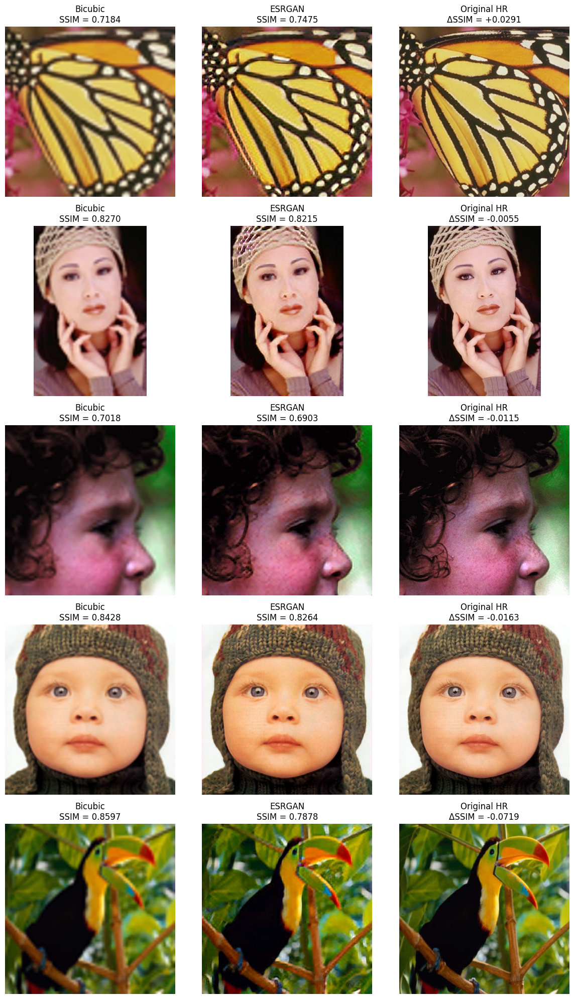

In [17]:
# Razlika između ESRGAN i Bicubic SSIM-a za svaku sliku
ssim_improvement_set5 = np.array(ssim_esrgan_set5) - np.array(ssim_bicubic_set5)

# Indeksi svih slika sortirani od najvećeg do najmanjeg poboljšanja SSIM-a
sorted_indices = np.argsort(ssim_improvement_set5)[::-1]

fig, axes = plt.subplots(5, 3, figsize=(12, 20))

for i, idx in enumerate(sorted_indices):

    # Bicubic
    axes[i, 0].imshow(X_set5_eval[idx])
    axes[i, 0].set_title(f"Bicubic\nSSIM = {ssim_bicubic_set5[idx]:.4f}")
    axes[i, 0].axis("off")

    # ESRGAN
    axes[i, 1].imshow(predictions_set5[idx])
    axes[i, 1].set_title(f"ESRGAN\nSSIM = {ssim_esrgan_set5[idx]:.4f}")
    axes[i, 1].axis("off")

    # Original HR
    axes[i, 2].imshow(y_set5_eval[idx])
    axes[i, 2].set_title(
        f"Original HR\nΔSSIM = {ssim_improvement_set5[idx]:+.4f}"
    )
    axes[i, 2].axis("off")

plt.tight_layout()

plt.show()

<small>

> Vizuelno poređenje na **Set5 test skupu** pokazuje da **Pretrained ESRGAN** generiše **oštrije ivice, izraženije konture i detaljnije teksture** u odnosu na **Bicubic interpolaciju**, što je naročito uočljivo na strukturama poput **krila leptira, lica i teksture kape**. <br>
> Najizraženije poboljšanje uočava se na slici **leptira**, gde Pretrained ESRGAN ostvaruje **SSIM = 0.7475** u odnosu na **SSIM = 0.7184** kod Bicubic interpolacije, odnosno $\Delta SSIM = +0.0291$. Na preostalim slikama Bicubic ostvaruje viši SSIM, pri čemu su razlike kod pojedinih primera relativno male. <br>
> U poređenju sa **ESRGAN-om bez pretreniranja**, kod kog je za sliku leptira ostvareno $\Delta SSIM = +0.0141$, pretreniranje generatora dovodi do **izraženijeg poboljšanja strukturne sličnosti** na ovom primeru. Istovremeno, rezultati pokazuju da efekat pretreniranja **nije jednak za sve slike** i zavisi od njihovog sadržaja i složenosti tekstura. 

> Vizuelni rezultati su u skladu sa prosečnim metrikama na Set5 skupu, koje pokazuju da pretreniranje generatora **poboljšava ukupne performanse ESRGAN-a**, iako Bicubic interpolacija i dalje ostvaruje više prosečne vrednosti **PSNR-a i SSIM-a**.

</small>

##### 3\) Evaluacija modela na "Set14" test skupu

<small>

Vrši se **evaluacija ESRGAN modela** na nezavisnom **Set14** test skupu, pri čemu se **njegove performanse** porede sa **bicubic interpolacijom** korišćenjem **PSNR** i **SSIM metrika**.

</small>

In [18]:
results_set14, X_set14_eval, predictions_set14, y_set14_eval, ssim_bicubic_set14, ssim_esrgan_set14 = evaluate_test_set(generator, X_test_set14_tensor, y_test_set14_tensor, "Set14")

results_set14

,Dataset,Method,PSNR,SSIM
0,Set14,Bicubic,24.256168,0.685504
1,Set14,ESRGAN,23.812411,0.689647


<small>

> Na **Set14 test skupu**, **Bicubic interpolacija** ostvaruje višu vrednost **PSNR-a = 24.26 dB**, dok **Pretrained ESRGAN** ostvaruje **PSNR = 23.81 dB**. Međutim, Pretrained ESRGAN ostvaruje **višu SSIM vrednost = 0.6896** u odnosu na **SSIM = 0.6855** kod Bicubic interpolacije. <br>
> Dobijeni rezultati pokazuju da **Pretrained ESRGAN nadmašuje Bicubic interpolaciju prema SSIM metrici**, dok Bicubic i dalje ostvaruje bolji rezultat prema **PSNR metrici**. <br>
> U odnosu na **ESRGAN bez pretreniranja**, koji ostvaruje **PSNR = 23.31 dB** i **SSIM = 0.6689**, pretreniranje generatora dovelo je do **poboljšanja obe posmatrane metrike**, pri čemu je poboljšanje SSIM-a dovoljno da Pretrained ESRGAN nadmaši Bicubic interpolaciju prema ovoj metrici. 

> Dobijeni rezultati ukazuju na **pozitivan uticaj pretreniranja generatora**, posebno u pogledu **očuvanja strukturnih karakteristika slike**, dok je rezultate potrebno dodatno sagledati kroz **vizuelno poređenje rekonstruisanih slika**.

</small>

<small>

U nastavku je prikazano **vizuelno poređenje** rezultata **ESRGAN generatora** sa **Bicubic interpolacijom** i odgovarajućim originalnim **HR slikama**.

- Njihovim vizuelnim **poređenjem** sa **originalnim HR slikama** možemo jasnije uočiti razlike u kvalitetu rekonstrukcije i način na koji **ESRGAN generator** rekonstruiše **teksture, strukture i sitne detalje**.
- Posebno se posmatraju **ivice**, **konture**, **teksture** i **sitniji detalji**, kao i eventualne razlike između **vizuelnog kvaliteta generisanih slika** i rezultata dobijenih prema **SSIM metrici**.

</small>

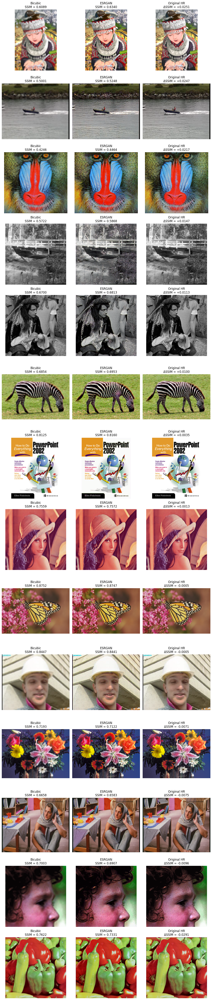

In [19]:
# Razlika između ESRGAN i Bicubic SSIM-a za svaku sliku 
ssim_improvement_set14 = np.array(ssim_esrgan_set14) - np.array(ssim_bicubic_set14) 
 
# Indeksi svih slika sortirani od najvećeg do najmanjeg poboljšanja SSIM-a 
sorted_indices = np.argsort(ssim_improvement_set14)[::-1] 
 
fig, axes = plt.subplots(14, 3, figsize=(12, 56)) 
 
for i, idx in enumerate(sorted_indices): 
 
    # Bicubic 
    axes[i, 0].imshow(X_set14_eval[idx]) 
    axes[i, 0].set_title(f"Bicubic\nSSIM = {ssim_bicubic_set14[idx]:.4f}") 
    axes[i, 0].axis("off") 
 
    # ESRGAN 
    axes[i, 1].imshow(predictions_set14[idx]) 
    axes[i, 1].set_title(f"ESRGAN\nSSIM = {ssim_esrgan_set14[idx]:.4f}") 
    axes[i, 1].axis("off") 
 
    # Original HR 
    axes[i, 2].imshow(y_set14_eval[idx]) 
    axes[i, 2].set_title(f"Original HR\nΔSSIM = {ssim_improvement_set14[idx]:+.4f}") 
    axes[i, 2].axis("off") 
 
plt.tight_layout() 
plt.show()

<small>

> Vizuelno poređenje na **Set14 test skupu** pokazuje da **Pretrained ESRGAN generator** u velikom broju slučajeva proizvodi **oštrije slike**, sa izraženijim **ivicama, konturama i teksturama** u odnosu na **Bicubic interpolaciju**. Ovo je posebno uočljivo kod slika sa **složenijim teksturama i većim brojem sitnih detalja**. <br>
> Za razliku od ESRGAN-a bez pretreniranja, **Pretrained ESRGAN ostvaruje višu SSIM vrednost za većinu prikazanih slika**, što ukazuje na to da je pretreniranje generatora doprinelo **boljem očuvanju strukturnih karakteristika** originalnih HR slika. <br>
> Najveća poboljšanja uočavaju se kod prvih prikazanih primera, gde $\Delta SSIM$ dostiže približno **+0.025**, dok su kod pojedinih slika razlike između metoda veoma male. Na nekoliko primera Bicubic interpolacija i dalje ostvaruje **nešto višu SSIM vrednost**. <br>

> Dobijeni rezultati pokazuju da efekat pretreniranja **nije jednak za sve slike**, ali da u celini dovodi do **poboljšanja strukturne sličnosti i kvaliteta rekonstrukcije**, što je u skladu sa višim prosečnim SSIM-om Pretrained ESRGAN-a na Set14 test skupu.

</small>

#### IX : Zaključak 

<small>

 U okviru eksperimenta analizirane su **dve strategije treniranja ESRGAN modela** — direktno **adversarijalno treniranje generatora i diskriminatora** i pristup sa prethodnim **pretreniranjem generatora pomoću L1 pixel loss-a**, nakon čega se nastavlja adversarijalni trening. Na ovaj način ispitan je uticaj početnog pretreniranja generatora na konačan kvalitet rekonstrukcije slika.

- Rezultati na **Set5** i **Set14 test skupovima** pokazuju da **Pretrained ESRGAN ostvaruje bolje PSNR i SSIM vrednosti na oba test skupa** u odnosu na ESRGAN bez pretreniranja. Na **Set5** skupu PSNR je povećan sa **25.44 dB na 25.88 dB**, a SSIM sa **0.7694 na 0.7747**, dok je na **Set14** skupu PSNR povećan sa **23.31 dB na 23.81 dB**, a SSIM sa **0.6689 na 0.6896**. 
- Posebno je značajan rezultat na **Set14 test skupu**, gde Pretrained ESRGAN ostvaruje **viši prosečni SSIM od Bicubic interpolacije** ($0.6896$ u odnosu na $0.6855$), iako Bicubic interpolacija i dalje ostvaruje viši PSNR. Na **Set5** skupu Bicubic interpolacija ostaje uspešnija prema obe posmatrane metrike. 
- Dobijeni rezultati ukazuju na **pozitivan uticaj pretreniranja generatora**. Početna optimizacija pomoću **L1 pixel loss-a** omogućava generatoru da pre adversarijalnog treninga nauči osnovno preslikavanje između **LR i HR prostora**, čime u narednu fazu treninga ulazi sa kvalitetnijom početnom reprezentacijom. U sprovedenom eksperimentu ovakav pristup pokazao se uspešnijim od direktnog adversarijalnog treniranja.
- **Vizuelna analiza** dodatno pokazuje da ESRGAN može generisati **oštrije ivice, izraženije konture i detaljnije teksture** u odnosu na Bicubic interpolaciju. Međutim, generisani detalji ne moraju uvek u potpunosti odgovarati strukturama originalne HR slike, zbog čega vizuelno oštriji rezultat ne dovodi nužno do povećanja **PSNR-a i SSIM-a**. Time se potvrđuje karakterističan **kompromis između perceptivnog kvaliteta i numeričke sličnosti** kod GAN pristupa super-rezoluciji. 
- Na osnovu **kvantitativnih i vizuelnih rezultata**, **Pretrained ESRGAN predstavlja uspešniju od dve analizirane varijante**, pri čemu rezultati ukazuju da pretreniranje generatora doprinosi **stabilnijoj početnoj rekonstrukciji i boljem očuvanju strukturnih karakteristika slike**. <br>

Zbog **vremenskih i računarskih ograničenja**, treniranje modela nije ponavljano sa većim brojem različitih slučajnih inicijalizacija, pa rezultate treba posmatrati u okviru **sprovedenog eksperimenta**, a ne kao statistički potvrđenu prednost jedne strategije treniranja. Dodatna evaluacija kroz **više nezavisnih pokretanja sa različitim seed vrednostima**, duži trening i dalje podešavanje hiperparametara mogla bi da pruži pouzdaniju procenu stabilnosti i performansi modela.

</small>